In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from logistic_map import logistic_map

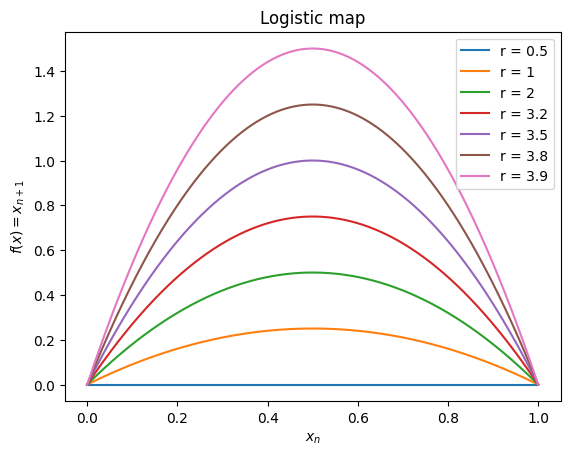

In [2]:
r = [0.5, 1, 2, 3.2, 3.5, 3.8, 3.9]
x = np.linspace(0, 1, 1000)
for r_i in range(len(r)):
    y = logistic_map(r_i, x)
    plt.plot(x, y)
plt.xlabel('$x_n$')
plt.ylabel('$f(x) = x_{n+1}$')
plt.title('Logistic map')
plt.legend(['r = 0.5', 'r = 1', 'r = 2', 'r = 3.2', 'r = 3.5', 'r = 3.8', 'r = 3.9'])
plt.show()

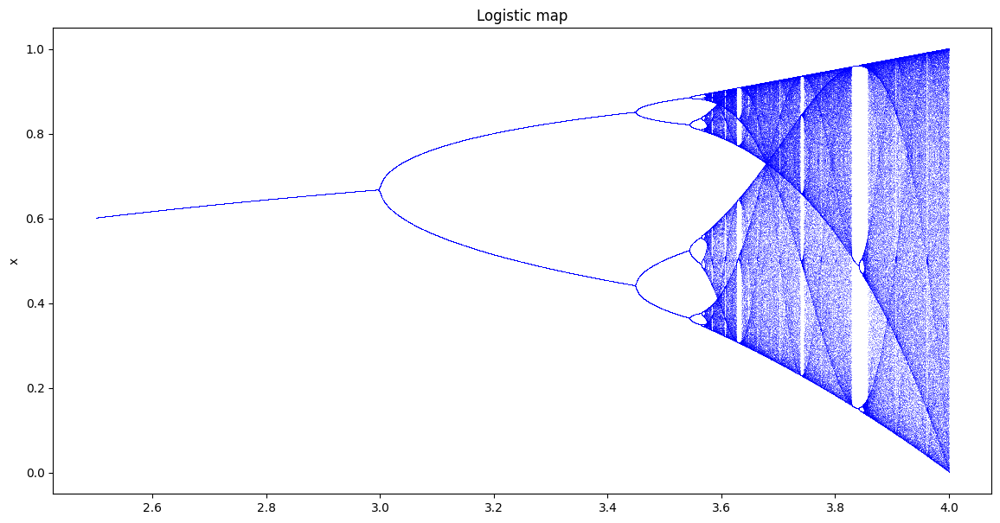

In [3]:
r_min = 2.5
r_max = 4.0
r_steps = 10000

n = 1000
last = 100

r_values = np.linspace(r_min, r_max, r_steps)
x_values = 0.5 * np.ones((r_steps))

bifurcation_diagram = []

for i in range(n):
    x_values = logistic_map(r_values, x_values)
    if i >= (n - last):
        bifurcation_diagram.append(x_values)

plt.figure(figsize=(14, 7))
plt.plot(r_values, np.array(bifurcation_diagram).T, ',b', alpha=0.25)
plt.ylabel('x')
plt.title('Logistic map')
plt.show()

In [6]:
r = np.concatenate((np.linspace(0.0, 3.5, 75), np.linspace(3.5, 4.0, 425)))

plt.rcParams['animation.html'] = 'jshtml'
plt.rcParams['figure.dpi'] = 125
plt.ioff()
fig, ax = plt.subplots()

def update(r):
    x = 0.5
    n = 50
    x_values = np.zeros(n)
    for i in range(n):
        x = logistic_map(r, x)
        x_values[i] = x
    ax.clear()
    ax.scatter(np.arange(n), x_values, c='b', s=2)
    ax.set_xlabel('n')
    ax.set_ylabel('x')
    ax.set_title(f'r = {r}')
    ax.set_xlim(0, n)
    ax.set_ylim(0, 1)
    return ax

ani = animation.FuncAnimation(fig, update, frames=r, repeat=False)
ani